<div style="padding: 20px; background-color: #000080; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <div style="border: 2px solid #000080; padding: 20px; text-align: center; border-radius: 10px; background-color: #ffffff;">
        <h1 style="color: #00000; font-size: 32px; text-transform: uppercase; letter-spacing: 2px; margin-bottom: 20px;">Become a feature selection master</h1>
        <div><em>
       If you like the content please consider an upvote. It is a great motivator to keep sharing code and ideas.
        Thank you!!!
    </em></div>
</div>

In this notebook we will dive through various feature selection options. We will illustrate this on two model architectures to show the differences there as well.

<h1 style="background-color: #000080; color: #ffff00;">Table of contents</h1>

* [Load tand install libraries](#1)
* [Load the data](#2)
* [Create helper functions and classes](#3)
* [Mastering feature selection](#4)
    * [Creating a baseline](#4.1)
    * [Using statistical methods](#4.2)
        * [No correlation to target](#4.2.1)
        * [Mutual information score](#4.2.2)
        * [Collinearity in the dataset](4.2.3)
    * [Using model inbuilt feature importance](#4.3)
        * [Linear Regression](#4.3.1)
        * [HistGradientBoosting](#4.3.2)
            * [Gain](#4.3.2.1)
            * [Weight](#4.3.2.2)
            * [Cover](#4.3.2.3)
            * [Total gain](#4.3.2.4)
            * [Total cover](#4.3.2.5)
    * [Using feature selection algorithms](#4.4)
        * [Using recursive feature elimination](#4.4.1)
        * [Using recursive feature elimination with inbuilt cross validation](#4.4.2)
        * [Sequential feature selection](#4.4.3)
        * [Lime](#4.4.4)
        * [Shap](#4.4.5)
        * [Boruta](#4.4.5)
* [Comparing the results](#5.0)
* [How to (not) interpret feature importance](#6.0)
* [Submission time](#7.0)

<h1 style="background-color: #000080; color: #ffff00;">Load and install libraries</h1>

In [1]:
%%capture
!pip install lime

In [2]:
import numpy as np
import pandas as pd
import time

import lime
from lime import lime_tabular
from lime import submodular_pick

import optuna
import shap

from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_classif, RFE, RFECV, SequentialFeatureSelector
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import make_scorer, accuracy_score

import xgboost as xgb

<h1 style="background-color: #000080; color: #ffff00;">Load the data</h1>

In [3]:
train = pd.read_csv(r'/kaggle/input/titanic/train.csv')
test = pd.read_csv(r'/kaggle/input/titanic/test.csv')
sample_submission = pd.read_csv(r'/kaggle/input/titanic/gender_submission.csv')

In [4]:
target = "Survived"

In [5]:
# borrowed from here: https://www.kaggle.com/code/tisa33/titanic-sk-87-2-rf-84-4-tf-87-1-rf-84-9/notebook
def normailize_data(df):
    df['Cabin_Letter'] = df['Cabin'].apply(lambda x: str(x)[0])
    df['Name_Title'] = df['Name'].apply(lambda x: x.split()[1]).apply(lambda x: x.split()[0])
    df['Name_Len'] = df['Name'].apply(lambda x: len(x))
    df['Age_Null'] = df['Age'].apply(lambda x: 1 if pd.isnull(x) else 0)
    #df['Age'] = df.groupby(['Name_Title', 'Pclass', 'Sex'])['Age'].transform(lambda x: x.fillna(x.mean()))
    df['Age'] = df['Age'].fillna(0)
    df['Ticket_Type'] = df['Ticket'].apply(lambda x: x[0])
    df['Age'] = (df['Age'] - df['Age'].min()) / (df['Age'].max() - df['Age'].min())
    df['Fare'] = (df['Fare'] - df['Fare'].min()) / (df['Fare'].max() - df['Fare'].min())
    df['Name_Len'] = (df['Name_Len'] - df['Name_Len'].min()) / (df['Name_Len'].max() - df['Name_Len'].min())
    df['SibSp'] = (df['SibSp'] - df['SibSp'].min()) / (df['SibSp'].max() - df['SibSp'].min())
    df['Parch'] = (df['Parch'] - df['Parch'].min()) / (df['Parch'].max() - df['Parch'].min())
    df = pd.get_dummies(df, columns=['Sex', 'Embarked', 'Name_Title', 'Cabin_Letter', 'Ticket_Type', 'Pclass'], drop_first=True, dtype=int)
    df = df.drop(['Name', 'Cabin', 'PassengerId', 'Ticket'], axis=1)
    return df

full_data = pd.concat([train, test])
full_data = normailize_data(full_data)
train = full_data.loc[full_data[target].isna() == False].copy().fillna(0)
test = full_data.loc[full_data[target].isna() == True].copy().fillna(0)

In [6]:
X = train.copy()
y = X.pop(target)

<h1 style="background-color: #000080; color: #ffff00;">Create helper functions and classes</h1>

In [7]:
class ResultTracker:
    def __init__(self):
        self.losses_mean = []
        self.losses_std = []
        self.runtime_secs = []
        self.model_name = []
        self.experiment_name  = []
        
    def eval_model(self, model, X, y):
        mae_scorer = make_scorer(accuracy_score, greater_is_better=True)
        start = time.time()
        losses = cross_val_score(model, X, y, cv=5, n_jobs=-1, scoring=mae_scorer)
        end = time.time()
        runtime_secs = end - start
        return np.mean(losses), np.std(losses),  runtime_secs
    
    def add_experiment(self, *, model, X, y, model_name, experiment_name):
        exp_mean, exp_std, runtime_secs = self.eval_model(model, X, y)
        print(f"Model {model_name} achieved a score of {exp_mean} with an std of {exp_std} in {runtime_secs} secs")
        
        self.losses_mean.append(exp_mean)
        self.losses_std.append(exp_std)
        self.runtime_secs.append(runtime_secs)
        self.model_name.append(model_name)
        self.experiment_name.append(experiment_name)
        
    def retrive_results(self):
        results_df = pd.DataFrame(
            {
                "losses_mean": self.losses_mean,
                "losses_std": self.losses_std,
                "runtime_secs": self.runtime_secs,
                "model_name": self.model_name,
                "experiment_name": self.experiment_name
            }
        )
        return results_df

In [8]:
tracker = ResultTracker()

<h1 style="background-color: #000080; color: #ffff00;">Mastering feature selection</h1>

Now that we installed everything we need and loaded our data it is time to deep dive into the actual topic. On purpose I do not preprocess the data, oping that we can see a bit more variation between both models.

Feel free to copy the notebook and play with some preprocessing.

<h2 style="background-color: #000080; color: #ffff00;">Creating a baseline</h2>

Before we start we create a bseline for our models were we just run them using all features.

In [9]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X, y=y, model_name="HistGradientBoosting", experiment_name="using_all_features")
tracker.add_experiment(model=lin_est, X=X, y=y, model_name="LogisticRegression", experiment_name="using_all_features")

Model HistGradientBoosting achieved a score of 0.8226727763480008 with an std of 0.01649095088807791 in 3.680934429168701 secs
Model LogisticRegression achieved a score of 0.8204255853367648 with an std of 0.02864899384162871 in 0.0760965347290039 secs


<h2 style="background-color: #000080; color: #ffff00;">Using statistical methods</h2>

In this section we will remove features based on statistical methods and properties.

<h3 style="background-color: #000080; color: #ffff00;">No correlation to target</h3>

We measure the correlation of all columns to the target and eliminate the ones that have almost no correlation. This captures linear relationships only, which is a hard limitation and might underestimate the value of a feature.

In [10]:
def calculate_correlations(df: pd.DataFrame, target: pd.Series) -> pd.DataFrame:
    """
    Calculates the correlations of all columns with regards to the target and returns a DataFrame with all column names
    and their correlation coefficient with regards to the target.
    
    :param df: Pandas DataFrame
    :param target: Pandas Series with target values
    :return: Pandas DataFrame with column names and their correlation coefficient with regards to the target
    """
    correlations = df.corrwith(target)
    return pd.DataFrame(correlations, columns=['correlation_coefficient'])

In [11]:
correlations = calculate_correlations(X, y)
correlations

,correlation_coefficient
Age,0.010539
SibSp,-0.035322
Parch,0.081629
Fare,0.257307
Name_Len,0.332350
...,...
Ticket_Type_P,0.151310
Ticket_Type_S,-0.035049
Ticket_Type_W,-0.057546
Pclass_2,0.093349


Here we remove the columns with a correlation coefficient close to zero.

In [12]:
keep_columns = correlations.loc[
    (
        (correlations["correlation_coefficient"] >= 0.1) |
        (correlations["correlation_coefficient"] <= -0.1)
    )
].index.to_list()

keep_columns

['Fare',
 'Name_Len',
 'Sex_male',
 'Embarked_S',
 'Name_Title_Miss.',
 'Name_Title_Mr.',
 'Name_Title_Mrs.',
 'Cabin_Letter_B',
 'Cabin_Letter_C',
 'Cabin_Letter_D',
 'Cabin_Letter_E',
 'Cabin_Letter_n',
 'Ticket_Type_3',
 'Ticket_Type_A',
 'Ticket_Type_P',
 'Pclass_3']

In [13]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_columns], y=y, model_name="HistGradientBoosting", experiment_name="removed_no_corr_to_target")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_columns], y=y, model_name="LogisticRegression", experiment_name="removed_no_corr_to_target")

Model HistGradientBoosting achieved a score of 0.8036344234511329 with an std of 0.027379687968800925 in 0.904163122177124 secs
Model LogisticRegression achieved a score of 0.786761659657272 with an std of 0.014123873083912195 in 0.0602869987487793 secs


<h3 style="background-color: #000080; color: #ffff00;">Mutual information score</h3>

We measure the mutual information score of all columns to with regards to the target and remove the ones with almost zero scoring. MI scores also consider non-linear information.

In [14]:
def calculate_mi_scores(df, target):
    """
    Calculates the mutual information score of all columns with regards to the (regression) target.
    
    Parameters:
    df (Pandas DataFrame): The DataFrame containing the features.
    target (Pandas Series): The target variable.
    
    Returns:
    Pandas DataFrame: A DataFrame with all column names and their MI scores with regards to the target.
    """
    mi_scores = mutual_info_classif(df, target)
    mi_scores = pd.Series(mi_scores, name='MI Scores', index=df.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores.to_frame()

In [15]:
mi_scores = calculate_mi_scores(X, y)
mi_scores

,MI Scores
Sex_male,0.163445
Fare,0.135732
Name_Title_Mr.,0.122084
Name_Len,0.103633
Cabin_Letter_n,0.054900
...,...
"Name_Title_Velde,",0.000000
"Name_Title_Steen,",0.000000
"Name_Title_Carlo,",0.000000
Name_Title_Ms.,0.000000


Interesting! Only the id column has very little value. So we only remove that one.

In [16]:
keep_columns = mi_scores.loc[(mi_scores["MI Scores"] >= 0.0)].index.to_list()

keep_columns

['Sex_male',
 'Fare',
 'Name_Title_Mr.',
 'Name_Len',
 'Cabin_Letter_n',
 'Name_Title_Miss.',
 'Name_Title_Mrs.',
 'Ticket_Type_F',
 'Pclass_3',
 'Cabin_Letter_E',
 'Ticket_Type_P',
 'Name_Title_Jonkheer.',
 'Ticket_Type_7',
 'Cabin_Letter_T',
 'Age',
 'Embarked_S',
 'Parch',
 'Ticket_Type_S',
 'Name_Title_Master.',
 'Age_Null',
 'Name_Title_Shawah,',
 'Name_Title_Capt.',
 'Cabin_Letter_C',
 'Cabin_Letter_B',
 'Name_Title_Khalil,',
 'Cabin_Letter_F',
 'Name_Title_Planke,',
 'Name_Title_Mlle.',
 'SibSp',
 'Name_Title_Palmquist,',
 'Name_Title_Dr.',
 'Ticket_Type_6',
 'Cabin_Letter_D',
 'Name_Title_der',
 'Name_Title_Brito,',
 'Embarked_Q',
 'Name_Title_Gordon,',
 'Name_Title_Mme.',
 'Name_Title_Col.',
 'Ticket_Type_C',
 'Name_Title_Rev.',
 'Ticket_Type_9',
 'Name_Title_Don.',
 'Ticket_Type_L',
 'Name_Title_Impe,',
 'Name_Title_Major.',
 'Ticket_Type_5',
 'Ticket_Type_W',
 'Ticket_Type_A',
 'Ticket_Type_8',
 'Pclass_2',
 'Name_Title_Mulder,',
 'Name_Title_Melkebeke,',
 'Ticket_Type_4',
 

In [17]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_columns], y=y, model_name="HistGradientBoosting", experiment_name="removed_low_mi_score_to_target")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_columns], y=y, model_name="LogisticRegression", experiment_name="removed_low_mi_score_to_target")

Model HistGradientBoosting achieved a score of 0.8226727763480006 with an std of 0.01097521926722228 in 1.4778385162353516 secs
Model LogisticRegression achieved a score of 0.8204255853367648 with an std of 0.02864899384162871 in 0.06644296646118164 secs


<h3 style="background-color: #000080; color: #ffff00;">Collinearity in the dataset</h3>

We measure the correlation of all columns to each other and remove the ones with high correlation (one of them).

In [18]:
def remove_collinearity(dataset, threshold=0.9):
    """
    Loops through all columns and checks, if features are highly positively correlated.
    If correlation is above given threshold, then only one column is kept.
    :param threshold: Maximum allowed correlation. Expects a float from -1 to +1.
    :return: Returns modified dataframe.
    """
    col_corr = set()  # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (
                corr_matrix.columns[j] not in col_corr
            ):
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname]  # deleting the column from the dataset
    return dataset

In [19]:
X_thres_09 = remove_collinearity(X.copy(), 0.9)
X_thres_09.columns.to_list()
print(f"Removed columns {set(X.columns.to_list()) - set(X_thres_09.columns.to_list())}")

Removed columns set()


In [20]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X_thres_09, y=y, model_name="HistGradientBoosting", experiment_name="removed_collinearity_with_090plus")
tracker.add_experiment(model=lin_est, X=X_thres_09, y=y, model_name="LogisticRegression", experiment_name="removed_collinearity_with_090plus")

Model HistGradientBoosting achieved a score of 0.8226727763480008 with an std of 0.01649095088807791 in 1.4731111526489258 secs
Model LogisticRegression achieved a score of 0.8204255853367648 with an std of 0.02864899384162871 in 0.0719904899597168 secs


In [21]:
X_thres_08 = remove_collinearity(X.copy(), 0.8)
X_thres_08.columns.to_list()
print(f"Removed columns {set(X.columns.to_list()) - set(X_thres_08.columns.to_list())}")

Removed columns {'Name_Title_Mr.'}


In [22]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X_thres_08, y=y, model_name="HistGradientBoosting", experiment_name="removed_collinearity_with_080plus")
tracker.add_experiment(model=lin_est, X=X_thres_08, y=y, model_name="LogisticRegression", experiment_name="removed_collinearity_with_080plus")

Model HistGradientBoosting achieved a score of 0.8193082669010107 with an std of 0.00957769381205687 in 1.443075180053711 secs
Model LogisticRegression achieved a score of 0.826031008725127 with an std of 0.02779141048557072 in 0.09639143943786621 secs


<h2 style="background-color: #000080; color: #ffff00;">Using model inbuilt feature importance</h2>

In this section we will invvestigate if the models itself provide us valueable information for feature selection.

<h3 style="background-color: #000080; color: #ffff00;">Linear Regression</h3>

For linear regression we need to train an instance first. Then we can make use of it's own coefficients to select features.

In [23]:
lin_est = LogisticRegression()
lin_est.fit(X, y)

LogisticRegression()

In [24]:
print(lin_est.coef_.shape, len(X.columns))
lin_est.coef_

(1, 67) 67


array([[-1.26836826, -2.22171938, -1.35275202,  0.71873876,  1.02384122,
        -0.5645056 , -1.63522012,  0.25964309, -0.34326716,  0.        ,
        -0.13424704, -0.30790936,  0.06837276, -0.08342326, -0.34254269,
        -0.18053407,  0.40432002, -0.57851042, -0.33586632,  0.        ,
        -0.04061364,  1.79074941, -0.09716645,  0.50435643,  0.49459713,
         0.15062311,  0.06894093, -0.73569689,  0.76674893,  0.24003438,
         0.78842234,  0.        , -0.12213086, -0.57618861, -0.88698026,
        -0.23957743, -0.10730336, -0.10676901, -0.11119572, -0.4154385 ,
         0.06064046,  0.15102603,  0.19663832, -0.27583558,  0.76952743,
         0.86541321,  0.15572634, -0.61482308, -0.29819382, -0.62853534,
        -0.1406039 , -0.91369688, -1.1085717 , -0.58027576, -0.06368129,
        -0.96118875, -0.24038735,  0.1371446 , -0.83526741, -0.20698204,
         0.09609536,  0.33000732, -0.21143127,  0.00891648, -1.32809348,
        -0.32435197, -0.86525348]])

In [25]:
((lin_est.coef_ < -0.05) | (lin_est.coef_ > 0.05))[0]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True])

We remove columns with coefficients close to zero..

In [26]:
keep_cols = X.loc[:, ((lin_est.coef_ < -0.05) | (lin_est.coef_ > 0.05))[0]].columns.to_list()
keep_cols

['Age',
 'SibSp',
 'Parch',
 'Fare',
 'Name_Len',
 'Age_Null',
 'Sex_male',
 'Embarked_Q',
 'Embarked_S',
 'Name_Title_Capt.',
 'Name_Title_Carlo,',
 'Name_Title_Col.',
 'Name_Title_Cruyssen,',
 'Name_Title_Don.',
 'Name_Title_Dr.',
 'Name_Title_Gordon,',
 'Name_Title_Impe,',
 'Name_Title_Jonkheer.',
 'Name_Title_Master.',
 'Name_Title_Melkebeke,',
 'Name_Title_Messemaeker,',
 'Name_Title_Miss.',
 'Name_Title_Mlle.',
 'Name_Title_Mme.',
 'Name_Title_Mr.',
 'Name_Title_Mrs.',
 'Name_Title_Ms.',
 'Name_Title_Mulder,',
 'Name_Title_Pelsmaeker,',
 'Name_Title_Planke,',
 'Name_Title_Rev.',
 'Name_Title_Shawah,',
 'Name_Title_Steen,',
 'Name_Title_Velde,',
 'Name_Title_Walle,',
 'Name_Title_der',
 'Name_Title_the',
 'Name_Title_y',
 'Cabin_Letter_B',
 'Cabin_Letter_C',
 'Cabin_Letter_D',
 'Cabin_Letter_E',
 'Cabin_Letter_F',
 'Cabin_Letter_G',
 'Cabin_Letter_T',
 'Cabin_Letter_n',
 'Ticket_Type_2',
 'Ticket_Type_3',
 'Ticket_Type_4',
 'Ticket_Type_5',
 'Ticket_Type_6',
 'Ticket_Type_7',
 'Ti

In [27]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="removed_lower_half_of_lr_coefficients")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="removed_lower_half_of_lr_coefficients")

Model HistGradientBoosting achieved a score of 0.8260435628648546 with an std of 0.012728910275995875 in 1.4154045581817627 secs
Model LogisticRegression achieved a score of 0.8215491808423827 with an std of 0.02894802237428172 in 0.0769658088684082 secs


<h3 style="background-color: #000080; color: #ffff00;">HistGradientBoosting</h3>

It seems like the HistGradientBoostingClassifier from sklearn does not offer any feature importance functionality. However we can make use of HistGradientBoosting also via the Xgboost library and get our importances from there.

Here we can pass one of multiple importance types via the importance_type parameter (see the [docs](https://xgboost.readthedocs.io/en/stable/python/python_api.html):
The feature importance type for the feature_importances_ property:
* For tree model, it’s either “gain”, “weight”, “cover”, “total_gain” or “total_cover”.
* For linear model, only “weight” is defined and it’s the normalized coefficients without bias.

As you can see there is a total of 5 feature importance metrics within gradient boosting. What is behind each of them I will quote from [this](https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7) Medium article. Please consider some claps there.


<h4 style="background-color: #000080; color: #ffff00;">HistGradientBoosting gain</h4>

"The Gain implies the relative contribution of the corresponding feature to the model calculated by taking each feature’s contribution for each tree in the model. A higher value of this metric when compared to another feature implies it is more important for generating a prediction.

The Gain is the most relevant attribute to interpret the relative importance of each feature.

‘Gain’ is the improvement in accuracy brought by a feature to the branches it is on. The idea is that before adding a new split on a feature X to the branch there was some wrongly classified elements, after adding the split on this feature, there are two new branches, and each of these branch is more accurate (one branch saying if your observation is on this branch then it should be classified as 1, and the other branch saying the exact opposite)."

In [28]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="gain")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type='gain',
              interaction_constraints=None, learning_rate=None, max_bin=255,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [29]:
xgb_gain = model.feature_importances_
xgb_gain

array([0.0135434 , 0.02883319, 0.0093273 , 0.01767678, 0.0123399 ,
       0.        , 0.26620883, 0.00521423, 0.01701247, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01941586, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04230755, 0.        , 0.        , 0.02395579,
       0.        , 0.        , 0.07754616, 0.01392192, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.12761562,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.00287151, 0.01627882, 0.00705073,
       0.01460894, 0.        , 0.        , 0.        , 0.06574743,
       0.00766516, 0.01376058, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00484979, 0.01086271,
       0.        , 0.        , 0.01218499, 0.01182252, 0.0217451 ,
       0.02385882, 0.11177391], dtype=float32)

In [30]:
keep_cols = X.loc[:, xgb_gain > 0.05].columns.to_list()
keep_cols

['Sex_male', 'Name_Title_Mr.', 'Name_Title_Rev.', 'Cabin_Letter_n', 'Pclass_3']

In [31]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="xgboost_importance_gain")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="xgboost_importance_gain")

Model HistGradientBoosting achieved a score of 0.7800326407632918 with an std of 0.008709637448781676 in 0.3093535900115967 secs
Model LogisticRegression achieved a score of 0.7900947837549432 with an std of 0.015659861494704365 in 0.0467069149017334 secs


<h4 style="background-color: #000080; color: #ffff00;">HistGradientBoosting weight</h4>

"The Frequency (R)/Weight (python) is the percentage representing the relative number of times a particular feature occurs in the trees of the model. In the above example, if feature1 occurred in 2 splits, 1 split and 3 splits in each of tree1, tree2 and tree3; then the weight for feature1 will be 2+1+3 = 6. The frequency for feature1 is calculated as its percentage weight over weights of all features."

In [32]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="weight")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type='weight',
              interaction_constraints=None, learning_rate=None, max_bin=255,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [33]:
xgb_weight = model.feature_importances_
xgb_weight

array([0.25703463, 0.03192641, 0.02164502, 0.26623377, 0.21861471,
       0.        , 0.02272727, 0.00324675, 0.0232684 , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00054113, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01677489, 0.        , 0.        , 0.00108225,
       0.        , 0.        , 0.01244589, 0.00595238, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00054113,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.0021645 , 0.01190476, 0.00757576,
       0.00541126, 0.        , 0.        , 0.        , 0.01136364,
       0.00974026, 0.02272727, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00487013, 0.00162338,
       0.        , 0.        , 0.00324675, 0.01298701, 0.00162338,
       0.00595238, 0.01677489], dtype=float32)

In [34]:
keep_cols = X.loc[:, xgb_weight > 0.05].columns.to_list()
keep_cols

['Age', 'Fare', 'Name_Len']

In [35]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="xgboost_importance_weight")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="xgboost_importance_weight")

Model HistGradientBoosting achieved a score of 0.7149959199045886 with an std of 0.03786511167697809 in 0.7832012176513672 secs
Model LogisticRegression achieved a score of 0.685757328479066 with an std of 0.016814167133173404 in 0.0418243408203125 secs


<h4 style="background-color: #000080; color: #ffff00;">HistGradientBoosting cover</h4>

"The Coverage metric means the relative number of observations related to this feature. For example, if you have 100 observations, 4 features and 3 trees, and suppose feature1 is used to decide the leaf node for 10, 5, and 2 observations in tree1, tree2 and tree3 respectively; then the metric will count cover for this feature as 10+5+2 = 17 observations. This will be calculated for all the 4 features and the cover will be 17 expressed as a percentage for all features’ cover metrics."

In [36]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="cover")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type='cover',
              interaction_constraints=None, learning_rate=None, max_bin=255,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [37]:
xgb_cover = model.feature_importances_
xgb_cover

array([0.01676155, 0.01472439, 0.01844941, 0.02428181, 0.02002116,
       0.        , 0.0733851 , 0.00499388, 0.03057476, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.04707531, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.0646151 , 0.        , 0.        , 0.00690226,
       0.        , 0.        , 0.02320972, 0.03372166, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.05071908,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.04474477, 0.01116774, 0.06085984,
       0.07158813, 0.        , 0.        , 0.        , 0.03167669,
       0.01213521, 0.02077974, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.05531023, 0.02401487,
       0.        , 0.        , 0.03828023, 0.03123656, 0.10688441,
       0.02607676, 0.03580966], dtype=float32)

In [38]:
keep_cols = X.loc[:, xgb_cover > 0.05].columns.to_list()
keep_cols

['Sex_male',
 'Name_Title_Master.',
 'Name_Title_Rev.',
 'Cabin_Letter_D',
 'Cabin_Letter_E',
 'Ticket_Type_A',
 'Ticket_Type_W']

In [39]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="xgboost_importance_cover")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="xgboost_importance_cover")

Model HistGradientBoosting achieved a score of 0.794620551126734 with an std of 0.018228868104151152 in 0.2340531349182129 secs
Model LogisticRegression achieved a score of 0.7901136149645345 with an std of 0.019100377882376823 in 0.0467984676361084 secs


<h4 style="background-color: #000080; color: #ffff00;">HistGradientBoosting total_gain</h4>

In [40]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="total_gain")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type='total_gain',
              interaction_constraints=None, learning_rate=None, max_bin=255,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [41]:
xgb_total_gain = model.feature_importances_
xgb_total_gain

array([0.14452143, 0.03821693, 0.0083816 , 0.19537959, 0.11199635,
       0.        , 0.25117862, 0.00070283, 0.01643413, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00043618, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.02946392, 0.        , 0.        , 0.00107635,
       0.        , 0.        , 0.04006813, 0.00344035, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00286691,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.00025804, 0.00804557, 0.00221755,
       0.00328193, 0.        , 0.        , 0.        , 0.03101766,
       0.00309959, 0.01298366, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00098057, 0.0007321 ,
       0.        , 0.        , 0.00164243, 0.00637429, 0.00146553,
       0.00589593, 0.07784184], dtype=float32)

In [42]:
keep_cols = X.loc[:, xgb_total_gain > 0.05].columns.to_list()
keep_cols

['Age', 'Fare', 'Name_Len', 'Sex_male', 'Pclass_3']

In [43]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="xgboost_importance_total_gain")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="xgboost_importance_total_gain")

Model HistGradientBoosting achieved a score of 0.8081099742640137 with an std of 0.013470583152657546 in 0.8187851905822754 secs
Model LogisticRegression achieved a score of 0.7901136149645346 with an std of 0.01842756354064995 in 0.046328067779541016 secs


<h4 style="background-color: #000080; color: #ffff00;">HistGradientBoostingRegressor total_cover</h4>

In [44]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="total_cover")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type='total_cover',
              interaction_constraints=None, learning_rate=None, max_bin=255,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [45]:
xgb_total_cover = model.feature_importances_
xgb_total_cover

array([0.18067877, 0.01971463, 0.01674718, 0.2711099 , 0.18355656,
       0.        , 0.06994496, 0.00067997, 0.02983532, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.0010683 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04545639, 0.        , 0.        , 0.00031327,
       0.        , 0.        , 0.01211426, 0.00841784, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00115099,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.00406164, 0.00557554, 0.01933562,
       0.01624577, 0.        , 0.        , 0.        , 0.01509587,
       0.004957  , 0.01980563, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.01129659, 0.00163494,
       0.        , 0.        , 0.00521225, 0.01701272, 0.00727671,
       0.00650947, 0.02519191], dtype=float32)

In [46]:
keep_cols = X.loc[:, xgb_total_cover > 0.05].columns.to_list()
keep_cols

['Age', 'Fare', 'Name_Len', 'Sex_male']

In [47]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="xgboost_importance_total_cover")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="xgboost_importance_total_cover")

Model HistGradientBoosting achieved a score of 0.7867553825874082 with an std of 0.023304255696803628 in 0.802293062210083 secs
Model LogisticRegression achieved a score of 0.7878664239532986 with an std of 0.015801680287401174 in 0.04020857810974121 secs


<h2 style="background-color: #000080; color: #ffff00;">Using feature selection algorithms</h2>

In this section we will investigate algorithms designed for feature selection.

<h3 style="background-color: #000080; color: #ffff00;">Using recursive feature elimination</h3>

"Given an external estimator that assigns weights to features (e.g., the coefficients of a linear model), the goal of recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. First, the estimator is trained on the initial set of features and the importance of each feature is obtained either through any specific attribute or callable. Then, the least important features are pruned from current set of features. That procedure is recursively repeated on the pruned set until the desired number of features to select is eventually reached." (see [sklearn docs](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html))

One disadvantage here is that we need to tell in advance how many features shall be selected. One re-occuring pattern in this section is that these algorithms are not model agnostic. Therefore we will test each of them for both of our models if possible.

In [48]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
hist_selector, lin_selector = RFE(hist_est, n_features_to_select=10, step=1), RFE(lin_est, n_features_to_select=10, step=1)

In [49]:
#hist_selector = hist_selector.fit(X, y)
#hist_selector.support_

This is not compatible with HistGradienBoosting as it misses `coef_` and `feature_importances_` attributes.

In [50]:
lin_selector = lin_selector.fit(X, y)
lin_selector.support_

array([False,  True,  True, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False,  True,  True, False,
       False,  True, False, False,  True, False, False, False, False,
       False,  True, False, False])

In [51]:
keep_cols = X.loc[:, lin_selector.support_].columns.to_list()
keep_cols

['SibSp',
 'Parch',
 'Sex_male',
 'Name_Title_Master.',
 'Cabin_Letter_n',
 'Ticket_Type_3',
 'Ticket_Type_4',
 'Ticket_Type_7',
 'Ticket_Type_A',
 'Ticket_Type_W']

In [52]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="rfe_based_on_logistic_regression")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="rfe_based_on_logistic_regression")

Model HistGradientBoosting achieved a score of 0.8226853304877283 with an std of 0.012389425379234905 in 0.5716044902801514 secs
Model LogisticRegression achieved a score of 0.8125478626577113 with an std of 0.03317577568032311 in 0.05377817153930664 secs


<h3 style="background-color: #000080; color: #ffff00;">Using recursive feature elimination with inbuilt cross validation</h3>

In [53]:
lin_est = LogisticRegression()
lin_selector = RFECV(lin_est, step=1, cv=5)

In [54]:
lin_selector = lin_selector.fit(X, y)
lin_selector.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True, False, False,  True,  True,  True,  True,
        True, False, False,  True, False,  True,  True,  True, False,
        True,  True,  True,  True, False, False,  True,  True,  True,
       False, False, False,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True, False,  True,  True,
       False,  True,  True,  True])

In [55]:
keep_cols = X.loc[:, lin_selector.support_].columns.to_list()
keep_cols

['Age',
 'SibSp',
 'Parch',
 'Fare',
 'Name_Len',
 'Age_Null',
 'Sex_male',
 'Embarked_Q',
 'Embarked_S',
 'Name_Title_Capt.',
 'Name_Title_Carlo,',
 'Name_Title_Don.',
 'Name_Title_Dr.',
 'Name_Title_Gordon,',
 'Name_Title_Impe,',
 'Name_Title_Jonkheer.',
 'Name_Title_Master.',
 'Name_Title_Messemaeker,',
 'Name_Title_Miss.',
 'Name_Title_Mlle.',
 'Name_Title_Mr.',
 'Name_Title_Mrs.',
 'Name_Title_Ms.',
 'Name_Title_Mulder,',
 'Name_Title_Planke,',
 'Name_Title_Rev.',
 'Name_Title_Shawah,',
 'Name_Title_der',
 'Name_Title_y',
 'Cabin_Letter_B',
 'Cabin_Letter_C',
 'Cabin_Letter_D',
 'Cabin_Letter_E',
 'Cabin_Letter_F',
 'Cabin_Letter_G',
 'Cabin_Letter_T',
 'Cabin_Letter_n',
 'Ticket_Type_2',
 'Ticket_Type_3',
 'Ticket_Type_4',
 'Ticket_Type_5',
 'Ticket_Type_7',
 'Ticket_Type_8',
 'Ticket_Type_9',
 'Ticket_Type_A',
 'Ticket_Type_C',
 'Ticket_Type_L',
 'Ticket_Type_P',
 'Ticket_Type_W',
 'Pclass_2',
 'Pclass_3']

In [56]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="rfecv_based_on_logistic_regression")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="rfecv_based_on_logistic_regression")

Model HistGradientBoosting achieved a score of 0.8260435628648546 with an std of 0.012728910275995875 in 1.2924294471740723 secs
Model LogisticRegression achieved a score of 0.8226727763480006 with an std of 0.030676683281000327 in 0.06981945037841797 secs


<h3 style="background-color: #000080; color: #ffff00;">Sequential feature selection</h3>

"This Sequential Feature Selector adds (forward selection) or removes (backward selection) features to form a feature subset in a greedy fashion. At each stage, this estimator chooses the best feature to add or remove based on the cross-validation score of an estimator. In the case of unsupervised learning, this Sequential Feature Selector looks only at the features (X), not the desired outputs (y)." (see [sklearn docs](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SequentialFeatureSelector.html))

In [57]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
hist_sfs, lin_sfs = SequentialFeatureSelector(hist_est, n_features_to_select=10), SequentialFeatureSelector(lin_est, n_features_to_select=10)

Skipping hist as this is really slow here

In [58]:
#hist_sfs.fit(X, y)
#hist_sfs.get_support()

In [59]:
#keep_cols = X.loc[:, hist_sfs.get_support()].columns.to_list()
#keep_cols

In [60]:
#hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
#tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="seq_feat_sel_on_histgb")
#tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="seq_feat_sel_on_histgb")

In [61]:
lin_sfs.fit(X, y)
lin_sfs.get_support()

array([False,  True, False,  True, False, False,  True, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False,  True, False, False,  True, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False])

In [62]:
keep_cols = X.loc[:, lin_sfs.get_support()].columns.to_list()
keep_cols

['SibSp',
 'Fare',
 'Sex_male',
 'Name_Title_Impe,',
 'Name_Title_Master.',
 'Name_Title_Miss.',
 'Name_Title_Mr.',
 'Cabin_Letter_C',
 'Cabin_Letter_n',
 'Ticket_Type_W']

In [63]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, keep_cols], y=y, model_name="HistGradientBoosting", experiment_name="seq_feat_sel_on_logistic_regression")
tracker.add_experiment(model=lin_est, X=X.loc[:, keep_cols], y=y, model_name="LogisticRegression", experiment_name="seq_feat_sel_on_logistic_regression")

Model HistGradientBoosting achieved a score of 0.8249074132195091 with an std of 0.02601611401897143 in 0.8028106689453125 secs
Model LogisticRegression achieved a score of 0.8305065595380077 with an std of 0.03054274488797953 in 0.04700136184692383 secs


<h3 style="background-color: #000080; color: #ffff00;">Lime</h3>

Lime is a model explanantion framework that tries to "solve for model interpretability by producing locally faithful explanations". (see the source of the quote and deeper explanations in [this](https://towardsdatascience.com/decrypting-your-machine-learning-model-using-lime-5adc035109b5) Medium article).

In [64]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()

In [65]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=100)

In [66]:
hist_est.fit(x_train, y_train)

HistGradientBoostingClassifier(random_state=100)

In [67]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=x_train.columns,
    mode='regression'
)

In [68]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=hist_est.predict
)

X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names


Lime offers us the ability to explain feature importance on row level. Let's show this for the second row in the DataFrame:

In [69]:
exp.show_in_notebook(show_table=True)

We use the sub-modular attributes available on SP-LIME to obtain a global perspective of the data instances. Then, we visualize the data to visual global representative samples extracted by the SP-LIME algorithm. This takes much longer than the local explanations.

In [70]:
%%capture
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        x_test.values,
                                        predict_fn=hist_est.predict,
                                        num_features=10,
                                        num_exps_desired=5)


In [71]:
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


It this not so easy to keep an overview here. Let's keep Sex_male and Name_Title_Master only.

In [72]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(
    model=hist_est, 
    X=X.loc[:, ["Sex_male", "Name_Title_Master."]], 
    y=y, 
    model_name="HistGradientBoosting", 
    experiment_name="lime_visual_inspection_based_on_hist"
)

tracker.add_experiment(
    model=lin_est, 
    X=X.loc[:, ["Sex_male", "Name_Title_Master."]],
    y=y, 
    model_name="LogisticRegression", 
    experiment_name="lime_visual_inspection_based_on_hist"
)

Model HistGradientBoosting achieved a score of 0.7934844014813884 with an std of 0.01899410639729653 in 0.1680436134338379 secs
Model LogisticRegression achieved a score of 0.7878664239532986 with an std of 0.015801680287401174 in 0.03221297264099121 secs


We do one for linear regression as well.

In [73]:
lin_est.fit(x_train, y_train)
explainer = lime_tabular.LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=x_train.columns,
    mode='regression'
)

In [74]:
%%capture
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        x_test.values,
                                        predict_fn=lin_est.predict,
                                        num_features=10,
                                        num_exps_desired=5)

In [75]:
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


For this example we keep Sex_male and Ticket_Type_3

In [76]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(
    model=hist_est, 
    X=X.loc[:, ["Sex_male", "Ticket_Type_3"]],
    y=y, 
    model_name="HistGradientBoosting", 
    experiment_name="lime_visual_inspection_based_on_logistic_regression"
)

tracker.add_experiment(
    model=lin_est, 
    X=X.loc[:, ["Sex_male", "Ticket_Type_3"]], 
    y=y, 
    model_name="LogisticRegression", 
    experiment_name="lime_visual_inspection_based_on_logistic_regression"
)

Model HistGradientBoosting achieved a score of 0.7867365513778168 with an std of 0.018667207932566335 in 0.20354676246643066 secs
Model LogisticRegression achieved a score of 0.7867365513778168 with an std of 0.018667207932566335 in 0.03999137878417969 secs


<h3 style="background-color: #000080; color: #ffff00;">Shap</h3>

"SHAP (SHapley Additive exPlanations) is a game theoretic approach to explain the output of any machine learning model. It connects optimal credit allocation with local explanations using the classic Shapley values from game theory and their related extensions[...]" ([source](https://shap.readthedocs.io/en/latest/))

The original paper can be found [here](https://proceedings.neurips.cc/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf).

In [77]:
hist_est.fit(x_train, y_train)

HistGradientBoostingClassifier(random_state=100)

HistGradientBoosting is not yet supported by Shaps TreeExplainer (which is much faster for tree-based models). Alos be aware, that a model trained on GPU will utilize GPU acceleration also within Shap!

In [78]:
explainer = shap.Explainer(hist_est.predict, x_test)
shap_values = explainer(x_test)

PermutationExplainer explainer: 180it [00:33,  4.53it/s]


Let's show the feature importances...

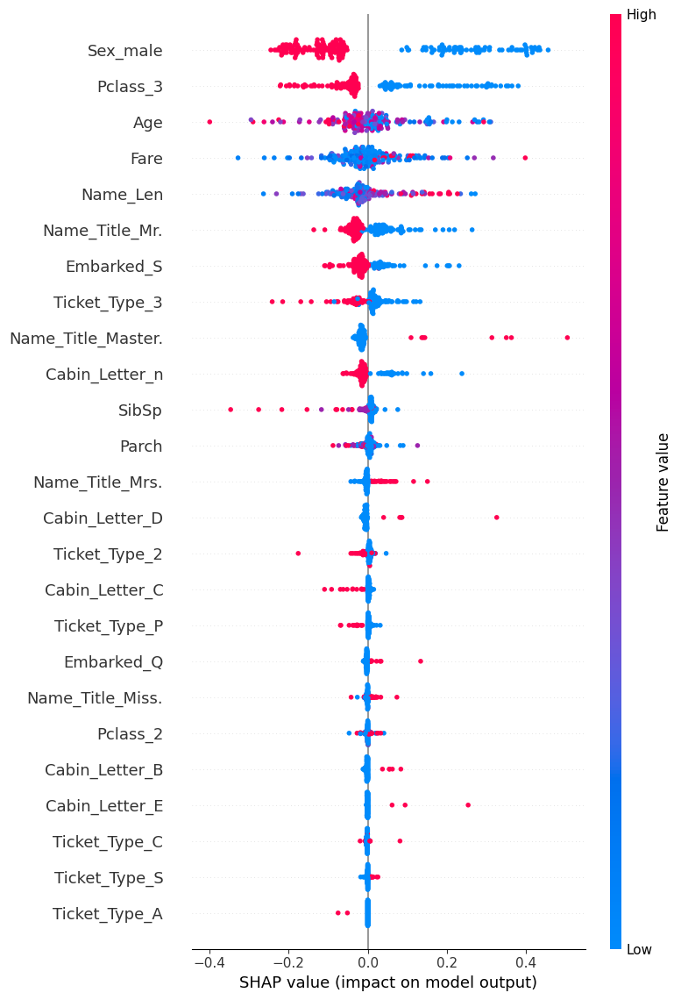

In [79]:
shap.summary_plot(shap_values, max_display=25, show=True)

We can also show this as a barplot.

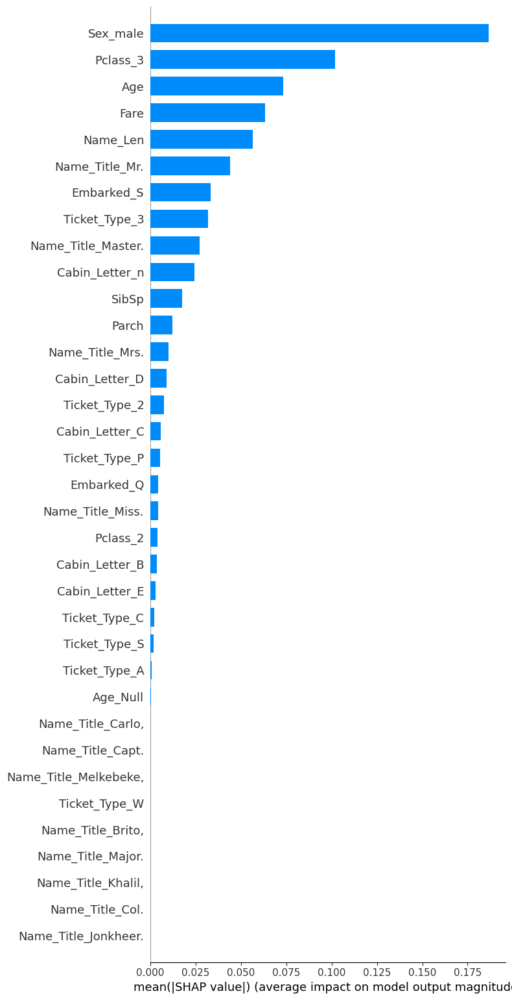

In [80]:
shap.summary_plot(shap_values, max_display=35, show=False, plot_type='bar')

In both plots the values are sorted top down by importance.
The shap library has also beautiful visuals to explore feature importance for individual rows and also dependency plots to better undersatnd feature interactions. I will skip this here as the Kernel is pretty long already.

Let's drop ["Name_Title_Gordon,", "Name_Title_Impe,", "Name_Itle_Jonkheer.", "Name_Title_Mlle.", "Ticket_Type_W", "Name_Title_Melkebelke"] etc here.

In [81]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()

In [82]:
drop_cols = [
    "Name_Title_Gordon,", 
    "Name_Title_Impe,", 
    "Name_Title_Jonkheer.", 
    "Name_Title_Mlle.", 
    "Ticket_Type_W", 
    "Name_Title_Melkebeke,",
    "Name_Title_Messemaeker,",
    "Name_Title_Col.",
    "Age_Null"
]

In [83]:
tracker.add_experiment(
    model=hist_est, 
    X=X.drop(drop_cols, axis=1),
    y=y, 
    model_name="HistGradientBoosting", 
    experiment_name="shap_visual_inspection_based_on_hist"
)

tracker.add_experiment(
    model=lin_est, 
    X=X.drop(drop_cols, axis=1), 
    y=y, 
    model_name="LogisticRegression", 
    experiment_name="shap_visual_inspection_based_on_hist"
)

Model HistGradientBoosting achieved a score of 0.8226727763480008 with an std of 0.01649095088807791 in 1.366065502166748 secs
Model LogisticRegression achieved a score of 0.8114556525014125 with an std of 0.02495837966860871 in 0.07034039497375488 secs


We do the same for linear regression as Shap (like Lime) is not model-agnostic.

In [84]:
lin_est.fit(x_train, y_train)

LogisticRegression()

In [85]:
explainer = shap.Explainer(lin_est.predict, x_test)
shap_values = explainer(x_test)

PermutationExplainer explainer: 180it [00:13,  3.33it/s]


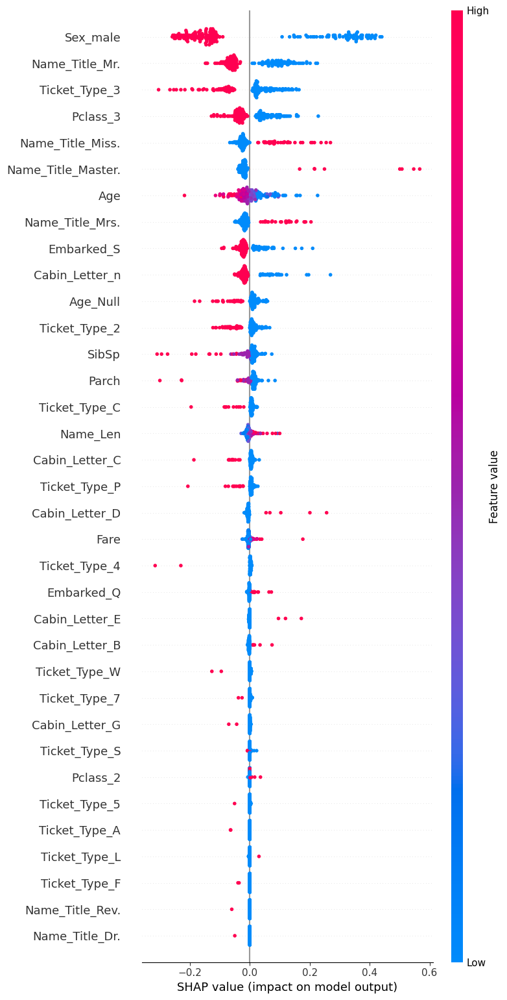

In [86]:
shap.summary_plot(shap_values, max_display=35, show=True)

Here we drop just Name_Title_Dr. and Ticket_Type_F and S.

In [87]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()

In [88]:
tracker.add_experiment(
    model=hist_est, 
    X=X.drop(["Name_Title_Dr.", "Ticket_Type_F", "Ticket_Type_S", "Name_Title_Rev."], axis=1),
    y=y, 
    model_name="HistGradientBoosting", 
    experiment_name="shap_visual_inspection_based_on_logistic_regression"
)

tracker.add_experiment(
    model=lin_est, 
    X=X.drop(["Name_Title_Dr.", "Ticket_Type_F", "Ticket_Type_S", "Name_Title_Rev."], axis=1), 
    y=y, 
    model_name="LogisticRegression", 
    experiment_name="shap_visual_inspection_based_on_logistic_regression"
)

Model HistGradientBoosting achieved a score of 0.8260435628648546 with an std of 0.012728910275995875 in 1.402008295059204 secs
Model LogisticRegression achieved a score of 0.8249074132195091 with an std of 0.026969183581597663 in 0.07071948051452637 secs


<h3 style="background-color: #000080; color: #ffff00;">Boruta</h3>

In Boruta, features do not compete among themselves. They are compared with a randomized version of them instead.
"In practice, starting from X, another dataframe is created by randomly shuffling each feature. These permuted features are called shadow features. At this point, the shadow dataframe is attached to the original dataframe to obtain a new dataframe (we will call it X_boruta), which has twice the number of columns of X."

For more details check out [this](https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a) Medium article.

Over the past decade the boruta algorithm has seen multiple implementations and variants. The original algorithm is quite slow. Instead we use a less-known, but powerful variant: boostaroota

Please be aware, that boostaroota was a research project and is not maintained. It seems like compatibility breaks with Panndas 2.0 or higher. However the code is open source and could be adapted.

In general I struggled to find any Boruta implementation that can be installed in this Kernel and just runs without an error. Therefore I decided to tak the boostaroota source code and add it below, but debug the breaking parts.

Boostaroota runs now and expects an estimator with a feature_imprtance_ attribute. This does not apply to HistGradientBoosting and linear regression, so we fallback to Xgboost once again.

In [89]:
import numpy as np
import pandas as pd
import xgboost as xgb
import operator
import warnings


########################################################################################
#
# Main Class and Methods
#
########################################################################################


class BoostARoota(object):

    def __init__(self, metric=None, clf=None, cutoff=4, iters=10, max_rounds=100, delta=0.1, silent=False):
        self.metric = metric
        self.clf = clf
        self.cutoff = cutoff
        self.iters = iters
        self.max_rounds = max_rounds
        self.delta = delta
        self.silent = silent
        self.keep_vars_ = None

        #Throw errors if the inputted parameters don't meet the necessary criteria
        if (metric is None) and (clf is None):
            raise ValueError('you must enter one of metric or clf as arguments')
        if cutoff <= 0:
            raise ValueError('cutoff should be greater than 0. You entered' + str(cutoff))
        if iters <= 0:
            raise ValueError('iters should be greater than 0. You entered' + str(iters))
        if (delta <= 0) | (delta > 1):
            raise ValueError('delta should be between 0 and 1, was ' + str(delta))

        #Issue warnings for parameters to still let it run
        if (metric is not None) and (clf is not None):
            warnings.warn('You entered values for metric and clf, defaulting to clf and ignoring metric')
        if delta < 0.02:
            warnings.warn("WARNING: Setting a delta below 0.02 may not converge on a solution.")
        if max_rounds < 1:
            warnings.warn("WARNING: Setting max_rounds below 1 will automatically be set to 1.")

    def fit(self, x, y):
        self.keep_vars_ = _BoostARoota(x, y,
                                       metric=self.metric,
                                       clf = self.clf,
                                       cutoff=self.cutoff,
                                       iters=self.iters,
                                       max_rounds=self.max_rounds,
                                       delta=self.delta,
                                       silent=self.silent)
        return self

    def transform(self, x):
        if self.keep_vars_ is None:
            raise ValueError("You need to fit the model first")
        return x[self.keep_vars_]

    def fit_transform(self, x, y):
        self.fit(x, y)
        return self.transform(x)

########################################################################################
#
# Helper Functions to do the Heavy Lifting
#
########################################################################################


def _create_shadow(x_train):
    """
    Take all X variables, creating copies and randomly shuffling them
    :param x_train: the dataframe to create shadow features on
    :return: dataframe 2x width and the names of the shadows for removing later
    """
    x_shadow = x_train.copy()
    for c in x_shadow.columns:
        np.random.shuffle(x_shadow[c].values)
    # rename the shadow
    shadow_names = ["ShadowVar" + str(i + 1) for i in range(x_train.shape[1])]
    x_shadow.columns = shadow_names
    # Combine to make one new dataframe
    new_x = pd.concat([x_train, x_shadow], axis=1)
    return new_x, shadow_names

########################################################################################
#
# BoostARoota
#
########################################################################################


def _reduce_vars_xgb(x, y, metric, this_round, cutoff, n_iterations, delta, silent):
    """
    Function to run through each
    :param x: Input dataframe - X
    :param y: Target variable
    :param metric: Metric to optimize in XGBoost
    :param this_round: Round so it can be printed to screen
    :return: tuple - stopping criteria and the variables to keep
    """
    #Set up the parameters for running the model in XGBoost - split is on multi log loss
    if metric == 'mlogloss':
        param = {'objective': 'multi:softmax',
                 'eval_metric': 'mlogloss',
                 'num_class': len(np.unique(y)),
                 'silent': 1}
    else:
        param = {'eval_metric': metric,
                 'silent': 1}
    for i in range(1, n_iterations+1):
        # Create the shadow variables and run the model to obtain importances
        new_x, shadow_names = _create_shadow(x)
        dtrain = xgb.DMatrix(new_x, label=y)
        bst = xgb.train(param, dtrain, verbose_eval=False)
        if i == 1:
            df = pd.DataFrame({'feature': new_x.columns})
            pass

        importance = bst.get_fscore()
        importance = sorted(importance.items(), key=operator.itemgetter(1))
        df2 = pd.DataFrame(importance, columns=['feature', 'fscore'+str(i)])
        df2['fscore'+str(i)] = df2['fscore'+str(i)] / df2['fscore'+str(i)].sum()
        df = pd.merge(df, df2, on='feature', how='outer')
        if not silent:
            print("Round: ", this_round, " iteration: ", i)

    df['Mean'] = df.mean(axis=1)
    #Split them back out
    real_vars = df[~df['feature'].isin(shadow_names)]
    shadow_vars = df[df['feature'].isin(shadow_names)]

    # Get mean value from the shadows
    mean_shadow = shadow_vars['Mean'].mean() / cutoff
    real_vars = real_vars[(real_vars.Mean > mean_shadow)]

    #Check for the stopping criteria
    #Basically looking to make sure we are removing at least 10% of the variables, or we should stop
    if (len(real_vars['feature']) / len(x.columns)) > (1-delta):
        criteria = True
    else:
        criteria = False

    return criteria, real_vars['feature']


def _reduce_vars_sklearn(x, y, clf, this_round, cutoff, n_iterations, delta, silent):
    """
    Function to run through each
    :param x: Input dataframe - X
    :param y: Target variable
    :param clf: the fully specified classifier passed in by user
    :param this_round: Round so it can be printed to screen
    :return: tuple - stopping criteria and the variables to keep
    """
    #Set up the parameters for running the model in XGBoost - split is on multi log loss

    for i in range(1, n_iterations+1):
        # Create the shadow variables and run the model to obtain importances
        new_x, shadow_names = _create_shadow(x)
        clf = clf.fit(new_x, np.ravel(y))

        if i == 1:
            df = pd.DataFrame({'feature': new_x.columns})
            df2 = df.copy()
            pass

        try:
            importance = clf.feature_importances_
            df2['fscore' + str(i)] = importance
        except ValueError:
            print("this clf doesn't have the feature_importances_ method.  Only Sklearn tree based methods allowed")

        # importance = sorted(importance.items(), key=operator.itemgetter(1))

        # df2 = pd.DataFrame(importance, columns=['feature', 'fscore'+str(i)])
        df2['fscore'+str(i)] = df2['fscore'+str(i)] / df2['fscore'+str(i)].sum()
        df = pd.merge(df, df2, on='feature', how='outer', suffixes=('', '_y'))
        df.drop(df.filter(regex='_y$').columns, axis=1, inplace=True)
        if not silent:
            print("Round: ", this_round, " iteration: ", i)

    df['Mean'] = df.drop("feature", axis=1).mean(axis=1)
    #Split them back out
    real_vars = df[~df['feature'].isin(shadow_names)]
    shadow_vars = df[df['feature'].isin(shadow_names)]

    # Get mean value from the shadows
    mean_shadow = shadow_vars['Mean'].mean() / cutoff
    real_vars = real_vars[(real_vars.Mean > mean_shadow)]

    #Check for the stopping criteria
    #Basically looking to make sure we are removing at least 10% of the variables, or we should stop
    if (len(real_vars['feature']) / len(x.columns)) > (1-delta):
        criteria = True
    else:
        criteria = False

    return criteria, real_vars['feature']

#Main function exposed to run the algorithm
def _BoostARoota(x, y, metric, clf, cutoff, iters, max_rounds, delta, silent):
    """
    Function loops through, waiting for the stopping criteria to change
    :param x: X dataframe One Hot Encoded
    :param y: Labels for the target variable
    :param metric: The metric to optimize in XGBoost
    :return: names of the variables to keep
    """

    new_x = x.copy()
    #Run through loop until "crit" changes
    i = 0
    while True:
        #Inside this loop we reduce the dataset on each iteration exiting with keep_vars
        i += 1
        if clf is None:
            crit, keep_vars = _reduce_vars_xgb(new_x,
                                               y,
                                               metric=metric,
                                               this_round=i,
                                               cutoff=cutoff,
                                               n_iterations=iters,
                                               delta=delta,
                                               silent=silent)
        else:
            crit, keep_vars = _reduce_vars_sklearn(new_x,
                                                   y,
                                                   clf=clf,
                                                   this_round=i,
                                                   cutoff=cutoff,
                                                   n_iterations=iters,
                                                   delta=delta,
                                                   silent=silent)

        if crit | (i >= max_rounds):
            break  # exit and use keep_vars as final variables
        else:
            new_x = new_x[keep_vars].copy()
    if not silent:
        print("BoostARoota ran successfully! Algorithm went through ", i, " rounds.")
    return keep_vars

In [90]:
model = xgb.XGBClassifier(tree_method='approx', max_bin=255, n_estimators=100, random_state=100, importance_type="total_cover")

br = BoostARoota(clf=model)

#Fit the model for the subset of variables
br.fit(X, y)

#Can look at the important variables - will return a pandas series
br.keep_vars_

Round:  1  iteration:  1
Round:  1  iteration:  2
Round:  1  iteration:  3
Round:  1  iteration:  4
Round:  1  iteration:  5
Round:  1  iteration:  6
Round:  1  iteration:  7
Round:  1  iteration:  8
Round:  1  iteration:  9
Round:  1  iteration:  10
Round:  2  iteration:  1
Round:  2  iteration:  2
Round:  2  iteration:  3
Round:  2  iteration:  4
Round:  2  iteration:  5
Round:  2  iteration:  6
Round:  2  iteration:  7
Round:  2  iteration:  8
Round:  2  iteration:  9
Round:  2  iteration:  10
Round:  3  iteration:  1
Round:  3  iteration:  2
Round:  3  iteration:  3
Round:  3  iteration:  4
Round:  3  iteration:  5
Round:  3  iteration:  6
Round:  3  iteration:  7
Round:  3  iteration:  8
Round:  3  iteration:  9
Round:  3  iteration:  10
BoostARoota ran successfully! Algorithm went through  3  rounds.


0                    Age
1                  SibSp
2                  Parch
3                   Fare
4               Name_Len
5               Sex_male
6             Embarked_S
7     Name_Title_Master.
8         Name_Title_Mr.
10        Cabin_Letter_D
11        Cabin_Letter_E
12        Cabin_Letter_n
13         Ticket_Type_3
14         Ticket_Type_S
15              Pclass_2
16              Pclass_3
Name: feature, dtype: object

In [91]:
hist_est, lin_est = HistGradientBoostingClassifier(random_state=100), LogisticRegression()
tracker.add_experiment(model=hist_est, X=X.loc[:, br.keep_vars_], y=y, model_name="HistGradientBoosting", experiment_name="boostaroota_on_histg")
tracker.add_experiment(model=lin_est, X=X.loc[:, br.keep_vars_], y=y, model_name="LogisticRegression", experiment_name="boostaroota_on_histg")

Model HistGradientBoosting achieved a score of 0.8282907538760906 with an std of 0.008227991222518525 in 0.9468529224395752 secs
Model LogisticRegression achieved a score of 0.8204444165463561 with an std of 0.010315500638846266 in 0.059476613998413086 secs


<h1 style="background-color: #000080; color: #ffff00;">Comparing the results</h1>

In [92]:
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

In [93]:
results = tracker.retrive_results()

results = results.style.apply(highlight_max, subset=['losses_mean'])
results

,losses_mean,losses_std,runtime_secs,model_name,experiment_name
0,0.822673,0.016491,3.680934,HistGradientBoosting,using_all_features
1,0.820426,0.028649,0.076097,LogisticRegression,using_all_features
2,0.803634,0.027380,0.904163,HistGradientBoosting,removed_no_corr_to_target
3,0.786762,0.014124,0.060287,LogisticRegression,removed_no_corr_to_target
4,0.822673,0.010975,1.477839,HistGradientBoosting,removed_low_mi_score_to_target
5,0.820426,0.028649,0.066443,LogisticRegression,removed_low_mi_score_to_target
6,0.822673,0.016491,1.473111,HistGradientBoosting,removed_collinearity_with_090plus
7,0.820426,0.028649,0.071990,LogisticRegression,removed_collinearity_with_090plus
8,0.819308,0.009578,1.443075,HistGradientBoosting,removed_collinearity_with_080plus
9,0.826031,0.027791,0.096391,LogisticRegression,removed_collinearity_with_080plus


So recursive feature elimination made the race here with logistic regression on top.

<h1 style="background-color: #000080; color: #ffff00;">How to (not) interpret feature importance</h1>

As shown above feature importance has many implementations and variants: From statistical approaches to dedicated feature selection algorithms, from a focus on local importance to an explanation of global importance.
They all have one thing in common though: They cannot be used to explain any causal relationships in the data (with a theoretical exception maybe). These algorithms just try to explain how a model behaves, but they do not explain how the data behaves.

<h1 style="background-color: #000080; color: #ffff00;">Submission time</h1>

Finally we will take the best feature space and make a submission before we finish.

In [94]:
lin_est = LogisticRegression()
lin_selector = RFECV(lin_est, step=1, cv=5)
lin_selector = lin_selector.fit(X, y)
lin_selector.support_
keep_cols = X.loc[:, lin_selector.support_].columns.to_list()
lin_est = LogisticRegression().fit(X.loc[:, keep_cols], y)

In [95]:
preds = lin_est.predict(test.loc[:, keep_cols])

In [96]:
sample_submission[target] = preds
sample_submission[target] = sample_submission[target].astype(int)
sample_submission.to_csv('submission.csv', index = False)

In [97]:
sample_submission

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
...,...,...
413,1305,0
414,1306,1
415,1307,0
416,1308,0


Feel free to also checkout the [cross validation mastery](https://www.kaggle.com/code/thomasmeiner/become-a-cross-validation-master) notebook.

<div style="padding: 20px; background-color: #000080; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <div style="border: 2px solid #000080; padding: 20px; text-align: center; border-radius: 10px; background-color: #ffffff;">
        <h1 style="color: #00000; font-size: 32px; text-transform: uppercase; letter-spacing: 2px; margin-bottom: 20px;">Consider an upvote</h1>
        <div><em>
       This notebook took a while to be created. Upvotes help keeping the motivation up :-)
    </em></div>
</div>